In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import logging
from tqdm.notebook import tqdm
import re
import tabulate

from engine.models import MultiTargetFunction
from engine.optimizers.population_based import MCOGeneticAlgorithm
from engine.initializers import RandomInitializer
from engine.strategies.selection import TournamentSelection, ElitismSelection, RouletteWheelSelection
from engine.strategies.mutation import RealCodedMutation
from engine.strategies.crossover import UniformCrossover
from engine.strategies.stopping import MaxGenerationsCriterion

# Silence engine logs
logging.getLogger("engine.utils").setLevel(logging.WARNING)

# 1. Setup the MCO Function
expressions =[
    "x / (abs(y + 1) + 1)",
    "exp(abs(x) + 1) + (y + 5)**2"
]
bounds = [(-10, 10), (-10, 10)]
target = MultiTargetFunction(expressions, bounds=bounds)
width = bounds[0][1] - bounds[0][0]

selection_strategies =[TournamentSelection(3), ElitismSelection(), RouletteWheelSelection()]
pop_sizes =[20, 50, 100]
phi_sel_values = [0.1, 0.2, 0.3, 0.4, 0.5]
n_runs = 30 # MCO is heavier, 30 runs is plenty for statistical significance

results_data =[]

# 2. The Experiment Loop
for sel in selection_strategies:
    for p in pop_sizes:
        for phi in tqdm(phi_sel_values, desc=f"{sel.__class__.__name__} | Pop={p}"):
            ratios = []
            spreads =[]
            
            for _ in range(n_runs):
                mut = RealCodedMutation(sigma=width * 0.05)
                ga = MCOGeneticAlgorithm(
                    target_function=target,
                    population_size=p,
                    initializer=RandomInitializer(),
                    selection_strategy=sel,
                    crossover_strategy=UniformCrossover(),
                    mutation_strategy=mut,
                    phi_sel=phi, 
                    phi_cross=1.0 - phi - 0.1, 
                    phi_mut=0.1,
                    stopping_criterion=MaxGenerationsCriterion(),
                )
                # Fixed 100 generations
                res = ga.run(max_iter=100)
                
                # Calculate MCO Metrics
                final_state = res.history[-1]
                p_mask = final_state["pareto_mask"]
                p_objs = final_state["objectives"][p_mask]
                
                # Metric 1: Ratio of population on the Pareto Front
                ratios.append(np.sum(p_mask) / p)
                
                # Metric 2: Spread of the Pareto Front
                if len(p_objs) > 1:
                    # Distance between the two extreme points on the front
                    extreme_1 = p_objs[np.argmin(p_objs[:, 0])]
                    extreme_2 = p_objs[np.argmax(p_objs[:, 0])]
                    spreads.append(np.linalg.norm(extreme_1 - extreme_2))
                else:
                    spreads.append(0.0)
                    
            results_data.append({
                "Selection": sel.__class__.__name__,
                "PopSize": p,
                "Fi_sel": phi,
                "AvgParetoRatio": np.mean(ratios),
                "AvgFrontSpread": np.mean(spreads)
            })

df_mco = pd.DataFrame(results_data)
display(df_mco)
with open("lab2_mco_experiment_table.md", "w", encoding="utf-8") as f:
    f.write(df_mco.to_markdown(index=False))

2026-05-07 18:13:12,239 [WARNING] Analytical gradient not available for 'x / (abs(y + 1) + 1)': Unsupported by <class 'sympy.printing.numpy.NumPyPrinter'>: <class 'sympy.core.function.Derivative'>
Printer has no method: _print_Derivative_re
Set the printer option 'strict' to False in order to generate partially printed code.. Using numerical fallback.
2026-05-07 18:13:12,257 [WARNING] Analytical Hessian not available for 'x / (abs(y + 1) + 1)': Unsupported by <class 'sympy.printing.numpy.NumPyPrinter'>: <class 'sympy.core.function.Derivative'>
Printer has no method: _print_Derivative_re
Set the printer option 'strict' to False in order to generate partially printed code.. Using numerical fallback.
2026-05-07 18:13:12,277 [WARNING] Analytical gradient not available for 'exp(abs(x) + 1) + (y + 5)**2': Unsupported by <class 'sympy.printing.numpy.NumPyPrinter'>: <class 'sympy.core.function.Derivative'>
Printer has no method: _print_Derivative_re
Set the printer option 'strict' to False in 

TournamentSelection | Pop=20:   0%|          | 0/5 [00:00<?, ?it/s]

TournamentSelection | Pop=50:   0%|          | 0/5 [00:00<?, ?it/s]

TournamentSelection | Pop=100:   0%|          | 0/5 [00:00<?, ?it/s]

ElitismSelection | Pop=20:   0%|          | 0/5 [00:00<?, ?it/s]

ElitismSelection | Pop=50:   0%|          | 0/5 [00:00<?, ?it/s]

ElitismSelection | Pop=100:   0%|          | 0/5 [00:00<?, ?it/s]

RouletteWheelSelection | Pop=20:   0%|          | 0/5 [00:00<?, ?it/s]

RouletteWheelSelection | Pop=50:   0%|          | 0/5 [00:00<?, ?it/s]

RouletteWheelSelection | Pop=100:   0%|          | 0/5 [00:00<?, ?it/s]

,Selection,PopSize,Fi_sel,AvgParetoRatio,AvgFrontSpread
0,TournamentSelection,20,0.1,0.536667,49.403832
1,TournamentSelection,20,0.2,0.796667,69.745721
2,TournamentSelection,20,0.3,0.805000,275.725481
3,TournamentSelection,20,0.4,0.836667,364.102036
4,TournamentSelection,20,0.5,0.938333,189.554235
5,TournamentSelection,50,0.1,0.556667,54.190256
6,TournamentSelection,50,0.2,0.752000,22.244866
7,TournamentSelection,50,0.3,0.862667,2033.744261
8,TournamentSelection,50,0.4,0.876667,346.842670
9,TournamentSelection,50,0.5,0.912667,44.889857


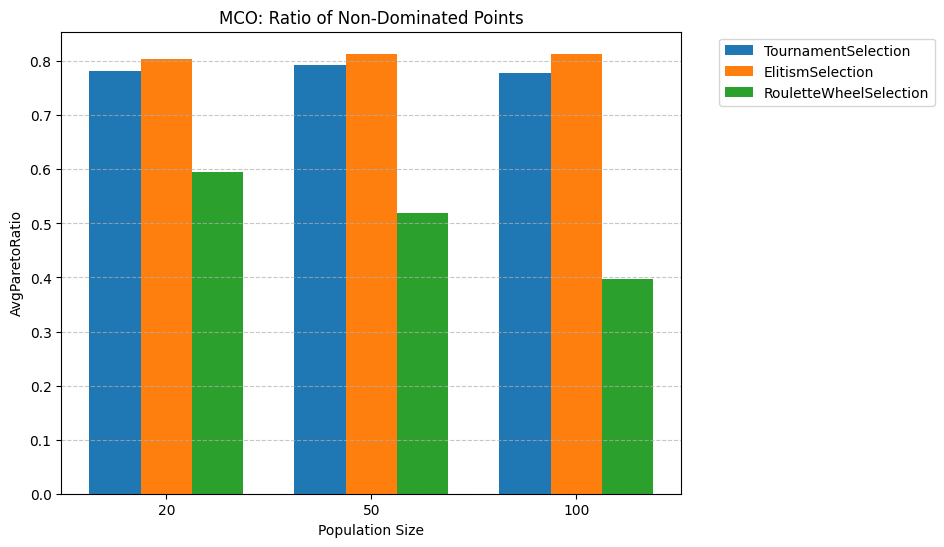

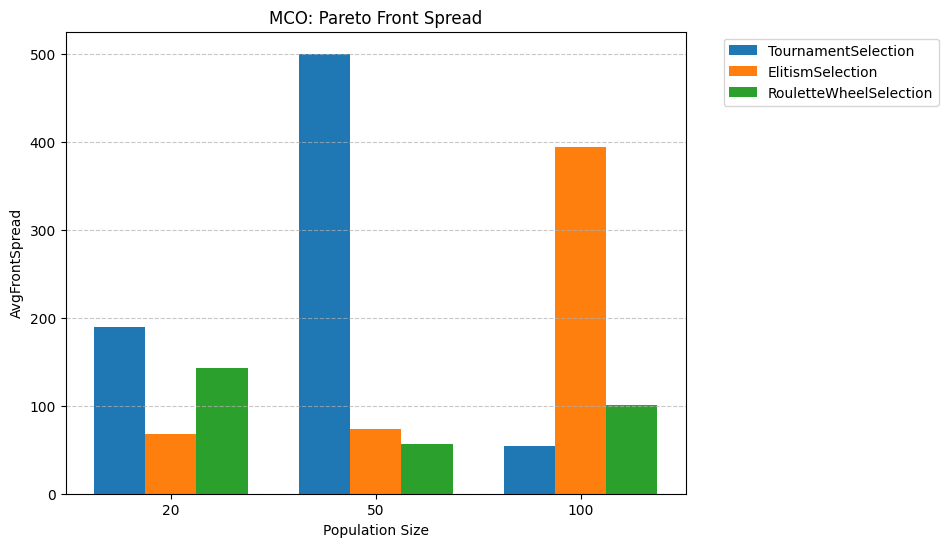

In [2]:
# --- Plotting the Results as Column Diagrams ---
def plot_mco_results_pop(df, metric, title):
    strategies = df['Selection'].unique()
    pop_sizes = sorted(df['PopSize'].unique())
    
    # Setup bar positions
    x = np.arange(len(pop_sizes))
    width = 0.25 # Adjust width based on number of bars
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    for i, strategy in enumerate(strategies):
        # Group by PopSize and calculate the mean for the metric
        strat_data = df[df['Selection'] == strategy].groupby('PopSize')[metric].mean()
        
        # Ensure values align correctly with the sorted pop_sizes
        y_values =[strat_data.get(p, 0) for p in pop_sizes]
        
        # Calculate offset to center the group of bars over the tick mark
        offset = (i - len(strategies) / 2 + 0.5) * width
        
        ax.bar(x + offset, y_values, width, label=strategy)
        
    ax.set_title(title)
    ax.set_xlabel('Population Size')
    ax.set_ylabel(metric)
    ax.set_xticks(x)
    ax.set_xticklabels(pop_sizes)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Horizontal grid lines look best for bar charts
    ax.grid(True, axis='y', linestyle='--', alpha=0.7) 
    
    safe_title = re.sub(r'[^A-Za-z0-9_]', '_', title.replace(' ', '_'))
    plt.savefig(f"{safe_title}_pop.png", dpi=300, bbox_inches='tight')
    plt.show()

# Generate the two requested column diagrams
plot_mco_results_pop(df_mco, 'AvgParetoRatio', 'MCO: Ratio of Non-Dominated Points')
plot_mco_results_pop(df_mco, 'AvgFrontSpread', 'MCO: Pareto Front Spread')

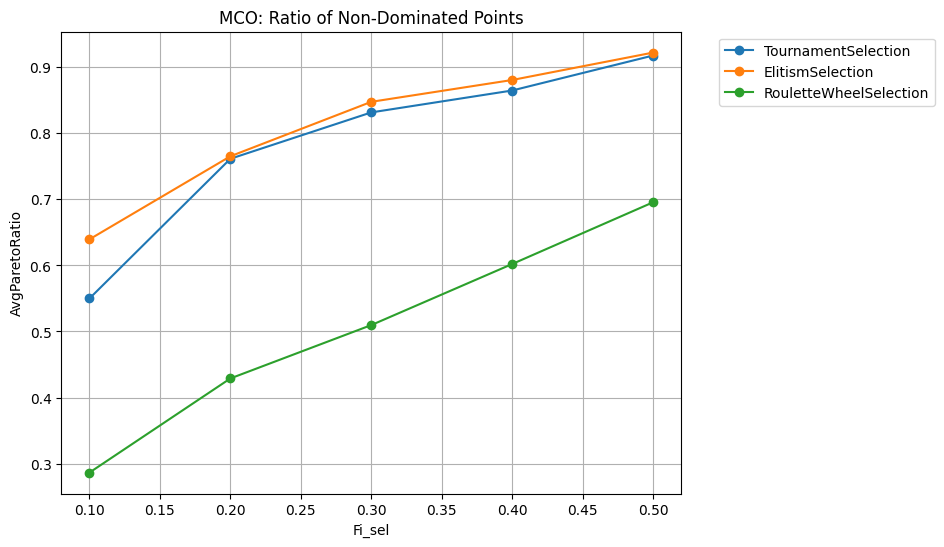

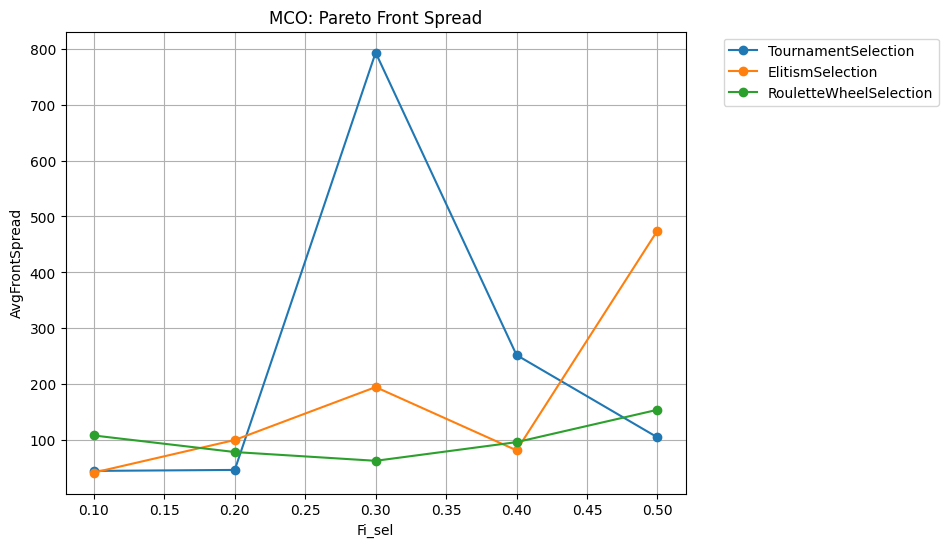

In [3]:
def plot_mco_results_fi(df, metric, title):
    strategies = df['Selection'].unique()
    plt.figure(figsize=(8, 6))
    
    for strategy in strategies:
        # Group by Fi_sel for this specific plot to show PopSize vs Metric
        strat_data = df[df['Selection'] == strategy].groupby('Fi_sel')[metric].mean()
        plt.plot(strat_data.index, strat_data.values, marker='o', label=strategy)
        
    plt.title(title)
    plt.xlabel('Fi_sel')
    plt.ylabel(metric)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    
    safe_title = re.sub(r'[^A-Za-z0-9_]', '_', title.replace(' ', '_'))
    plt.savefig(f"{safe_title}_fi.png", dpi=300, bbox_inches='tight')
    plt.show()

plot_mco_results_fi(df_mco, 'AvgParetoRatio', 'MCO: Ratio of Non-Dominated Points')
plot_mco_results_fi(df_mco, 'AvgFrontSpread', 'MCO: Pareto Front Spread')

In [4]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# 1. Run a single high-res optimization to animate
mco_ga = MCOGeneticAlgorithm(
    target, population_size=300,
    initializer=RandomInitializer(),
    selection_strategy=ElitismSelection(),
    crossover_strategy=UniformCrossover(),
    mutation_strategy=RealCodedMutation(sigma=1.0),
    phi_sel=0.2, phi_cross=0.7, phi_mut=0.1,
    stopping_criterion=MaxGenerationsCriterion(),
)
print("Running GA for animation...")
res = mco_ga.run(max_iter=100)

# 2. Setup the Side-by-Side Figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
plt.close() # Prevent static plot from showing

# Left Axis: Parameter Space (x, y)
ax1.set_xlim(-10, 10)
ax1.set_ylim(-10, 10)
ax1.set_title("Parameter Space (x, y)")
ax1.set_xlabel("x")
ax1.set_ylabel("y")
ax1.grid(True, linestyle='--', alpha=0.6)
scat_params_dom = ax1.scatter([], [], c='red', alpha=0.5, label='Dominated')
scat_params_par = ax1.scatter([],[], c='blue', s=50, edgecolors='black', label='Pareto Optimal')
ax1.legend(loc='upper right')

# Right Axis: Objective Space (f1, f2)
# Dynamically find the bounds for the objective space plot
all_objs = np.vstack([step["objectives"] for step in res.history])
ax2.set_xlim(all_objs[:, 0].min() - 1, all_objs[:, 0].max() + 1)
#ax2.set_ylim(all_objs[:, 1].min() - 10, all_objs[:, 1].max() + 10)
ax2.set_ylim(0,200)
ax2.set_title("Objective Space (f1, f2)")
ax2.set_xlabel("f1(x, y)")
ax2.set_ylabel("f2(x, y)")
ax2.grid(True, linestyle='--', alpha=0.6)
scat_objs_dom = ax2.scatter([],[], c='red', alpha=0.5, label='Dominated')
scat_objs_par = ax2.scatter([],[], c='blue', s=50, edgecolors='black', label='Pareto Optimal')
ax2.legend(loc='upper right')

# 3. Animation Update Function
def update(frame):
    state = res.history[frame]
    pop = state["population"]
    objs = state["objectives"]
    mask = state["pareto_mask"]
    
    # Update Parameter Space (x, y)
    scat_params_dom.set_offsets(pop[~mask])
    if np.any(mask):
        scat_params_par.set_offsets(pop[mask])
    else:
        scat_params_par.set_offsets(np.empty((0, 2)))
        
    # Update Objective Space (f1, f2)
    scat_objs_dom.set_offsets(objs[~mask])
    if np.any(mask):
        scat_objs_par.set_offsets(objs[mask])
    else:
        scat_objs_par.set_offsets(np.empty((0, 2)))
        
    fig.suptitle(f"MCO Generation {frame}", fontsize=14)
    return scat_params_dom, scat_params_par, scat_objs_dom, scat_objs_par

# 4. Generate and display the animation
print("Generating video... (this takes a few seconds)")
anim = FuncAnimation(fig, update, frames=len(res.history), interval=100, blit=True)

# Display as an interactive HTML5 video in the Jupyter Notebook
HTML(anim.to_jshtml())

Running GA for animation...


2026-05-07 18:21:43,344 [INFO] Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Generating video... (this takes a few seconds)
